<a href="https://colab.research.google.com/github/freitas-oa/Computer-Vision/blob/main/Hard_Mining_PPE_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
pip install ultralytics opencv-python roboflow numpy


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 20.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 46.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 78.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 111.1 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88
  Attempting uninstall: idna
    Found existing installation: idna 3.11
    Uninstalling idna-3.11:
      Successfully uninstalled idna-3.11


In [3]:
from roboflow import Roboflow
from ultralytics import YOLO
import os

# === 1. DOWNLOAD DATASET ===
rf = Roboflow(api_key="Y89fnR5Fz37PMRQ6ljyY")
project = rf.workspace("joseph-nelson").project("hard-hat-workers")
dataset = project.version(10).download("yolov8")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Hard-Hat-Workers-10 in yolov8:: 100%|██████████| 14082/14082 [00:01<00:00, 9251.57it/s] 


In [3]:

from pathlib import Path
import cv2
import numpy as np

MODEL_PATH = "/content/best.pt"
VAL_DIR = Path("/content/Hard-Hat-Workers-10/valid")
IMG_DIR = VAL_DIR / "images"
LBL_DIR = VAL_DIR / "labels"

model = YOLO(MODEL_PATH)

print(model.names)  # to see class ↔ id mapping


{0: 'head', 1: 'helmet', 2: 'person'}


In [4]:
HELMET_CLASS_ID = 1
IOU_THRESH = 0.5
CONF_THRESH = 0.25
SAVE_DIR = Path("/content/hard_negatives_helmet")
SAVE_DIR.mkdir(parents=True, exist_ok=True)


def yolo_to_xyxy(labels, img_w, img_h):
    """
    labels: array of shape (N, 5): [cls, x_c, y_c, w, h] normalized
    returns array of shape (N, 5): [cls, x1, y1, x2, y2] in pixels
    """
    boxes = []
    for row in labels:
        cls, x_c, y_c, w, h = row
        x_c *= img_w
        y_c *= img_h
        w   *= img_w
        h   *= img_h
        x1 = x_c - w / 2
        y1 = y_c - h / 2
        x2 = x_c + w / 2
        y2 = y_c + h / 2
        boxes.append([int(cls), x1, y1, x2, y2])
    return np.array(boxes, dtype=float)


def load_gt_boxes(label_path, img_shape):
    """
    Returns GT boxes as array [cls, x1, y1, x2, y2]
    """
    h, w = img_shape[:2]
    if not label_path.exists():
        return np.zeros((0, 5), dtype=float)

    with open(label_path, "r") as f:
        lines = f.read().strip().splitlines()
    if len(lines) == 0:
        return np.zeros((0, 5), dtype=float)

    labels = []
    for line in lines:
        parts = line.split()
        if len(parts) != 5:
            continue
        labels.append([float(p) for p in parts])
    labels = np.array(labels, dtype=float)
    return yolo_to_xyxy(labels, w, h)


def box_iou(boxA, boxB):
    """
    boxA, boxB: [x1, y1, x2, y2]
    """
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    inter_w = max(0, xB - xA)
    inter_h = max(0, yB - yA)
    inter_area = inter_w * inter_h

    if inter_area <= 0:
        return 0.0

    boxA_area = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxB_area = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

    return inter_area / float(boxA_area + boxB_area - inter_area)


In [5]:
import os, cv2, numpy as np
from pathlib import Path

HELMET_CLASS_ID = 0
CONF_THRESH = 0.25
IMG_DIR = Path("/content/Hard-Hat-Workers-10/valid/images")
SAVE_ALL_DIR = Path("/content/all_predicted_helmets")
SAVE_ALL_DIR.mkdir(parents=True, exist_ok=True)

image_paths = sorted([p for p in IMG_DIR.iterdir() if p.suffix.lower() in [".jpg", ".jpeg", ".png"]])

total_imgs = 0
total_preds = 0
total_helmet_preds = 0

for img_path in image_paths:
    total_imgs += 1
    img = cv2.imread(str(img_path))
    if img is None:
        print(f"Could not read image {img_path}")
        continue

    h, w = img.shape[:2]

    results = model.predict(source=str(img_path), conf=CONF_THRESH, verbose=False)
    boxes = results[0].boxes

    if boxes is None or len(boxes) == 0:
        continue

    pred_xyxy = boxes.xyxy.cpu().numpy()
    pred_cls  = boxes.cls.cpu().numpy()
    pred_conf = boxes.conf.cpu().numpy()

    total_preds += len(pred_xyxy)

    for i in range(len(pred_xyxy)):
        cls_id = int(pred_cls[i])
        conf   = float(pred_conf[i])

        if cls_id != HELMET_CLASS_ID:
            continue

        total_helmet_preds += 1
        x1, y1, x2, y2 = pred_xyxy[i]
        x1, y1, x2, y2 = int(max(0, x1)), int(max(0, y1)), int(min(w-1, x2)), int(min(h-1, y2))

        crop = img[y1:y2, x1:x2]
        save_name = f"{img_path.stem}_helmet_{total_helmet_preds:05d}.jpg"
        cv2.imwrite(str(SAVE_ALL_DIR / save_name), crop)

print("Images processed:", total_imgs)
print("Total predictions (all classes):", total_preds)
print("Total predicted helmets:", total_helmet_preds)
print("Saved helmet crops to:", SAVE_ALL_DIR)


Images processed: 1413
Total predictions (all classes): 5563
Total predicted helmets: 1471
Saved helmet crops to: /content/all_predicted_helmets


In [6]:
from pathlib import Path
import cv2, numpy as np

VAL_DIR = Path("/content/Hard-Hat-Workers-10/valid")
IMG_DIR = VAL_DIR / "images"
LBL_DIR = VAL_DIR / "labels"

HELMET_CLASS_ID = 0
IOU_THRESH = 0.5
CONF_THRESH = 0.25
SAVE_DIR = Path("/content/hard_negatives_helmet")
SAVE_DIR.mkdir(parents=True, exist_ok=True)

def yolo_to_xyxy(labels, img_w, img_h):
    boxes = []
    for row in labels:
        cls, x_c, y_c, w, h = row
        x_c *= img_w; y_c *= img_h
        w   *= img_w; h   *= img_h
        x1 = x_c - w/2; y1 = y_c - h/2
        x2 = x_c + w/2; y2 = y_c + h/2
        boxes.append([int(cls), x1, y1, x2, y2])
    return np.array(boxes, dtype=float)

def load_gt_boxes(label_path, img_shape):
    h, w = img_shape[:2]
    if not label_path.exists():
        return np.zeros((0, 5), dtype=float)
    with open(label_path, "r") as f:
        lines = f.read().strip().splitlines()
    if not lines:
        return np.zeros((0, 5), dtype=float)
    labels = np.array([[float(p) for p in line.split()] for line in lines], dtype=float)
    return yolo_to_xyxy(labels, w, h)

def box_iou(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])
    inter_w = max(0, xB - xA); inter_h = max(0, yB - yA)
    inter = inter_w * inter_h
    if inter <= 0: return 0.0
    areaA = (boxA[2]-boxA[0]) * (boxA[3]-boxA[1])
    areaB = (boxB[2]-boxB[0]) * (boxB[3]-boxB[1])
    return inter / (areaA + areaB - inter)

image_paths = sorted([p for p in IMG_DIR.iterdir() if p.suffix.lower() in [".jpg", ".jpeg", ".png"]])

fp_count = 0
helmet_pred_count = 0

for idx, img_path in enumerate(image_paths):
    img = cv2.imread(str(img_path))
    if img is None:
        print(f"[WARN] Could not read {img_path}")
        continue

    h, w = img.shape[:2]
    label_path = LBL_DIR / (img_path.stem + ".txt")
    gt_boxes = load_gt_boxes(label_path, img.shape)

    # count GT helmets
    gt_helmets = (gt_boxes[:,0] == HELMET_CLASS_ID).sum() if gt_boxes.size else 0

    results = model.predict(source=str(img_path), conf=CONF_THRESH, verbose=False)
    boxes = results[0].boxes
    if boxes is None or len(boxes) == 0:
        continue

    pred_xyxy = boxes.xyxy.cpu().numpy()
    pred_cls  = boxes.cls.cpu().numpy()
    pred_conf = boxes.conf.cpu().numpy()

    for i in range(len(pred_xyxy)):
        cls_id = int(pred_cls[i])
        if cls_id != HELMET_CLASS_ID:
            continue

        helmet_pred_count += 1
        px1, py1, px2, py2 = pred_xyxy[i]

        best_iou = 0.0
        best_gt_cls = None

        for gt in gt_boxes:
            gt_cls, gx1, gy1, gx2, gy2 = gt
            iou_val = box_iou([px1,py1,px2,py2], [gx1,gy1,gx2,gy2])
            if iou_val > best_iou:
                best_iou = iou_val
                best_gt_cls = int(gt_cls)

        # FALSE POSITIVE condition:
        if best_iou < IOU_THRESH or best_gt_cls is None or best_gt_cls != HELMET_CLASS_ID:
            fp_count += 1
            x1 = max(0, int(px1)); y1 = max(0, int(py1))
            x2 = min(w-1, int(px2)); y2 = min(h-1, int(py2))
            crop = img[y1:y2, x1:x2]
            save_name = f"{img_path.stem}_fpHelmet_{fp_count:05d}.jpg"
            cv2.imwrite(str(SAVE_DIR / save_name), crop)

print("Total predicted helmets:", helmet_pred_count)
print("Total false-positive helmets saved:", fp_count)
print("Saved to:", SAVE_DIR)


Total predicted helmets: 1471
Total false-positive helmets saved: 175
Saved to: /content/hard_negatives_helmet


In [7]:
from google.colab import files
!zip -r hard_negatives_helmet.zip /content/hard_negatives_helmet
files.download("hard_negatives_helmet.zip")


  adding: content/hard_negatives_helmet/ (stored 0%)
  adding: content/hard_negatives_helmet/006882_jpg.rf.7764a4c5b8b80c83a47af671e5d10a38_fpHelmet_00153.jpg (deflated 24%)
  adding: content/hard_negatives_helmet/005223_jpg.rf.778d170bd8483540f9c6014305332bb7_fpHelmet_00041.jpg (deflated 18%)
  adding: content/hard_negatives_helmet/005096_jpg.rf.df75643b3a44a04003a0addf20ac0c22_fpHelmet_00017.jpg (deflated 8%)
  adding: content/hard_negatives_helmet/006043_jpg.rf.9638304b43b4400ca0a92743bd3e2c01_fpHelmet_00054.jpg (deflated 8%)
  adding: content/hard_negatives_helmet/006675_jpg.rf.f496326df4e3fa2a23a32f9b7ceb5e75_fpHelmet_00127.jpg (deflated 15%)
  adding: content/hard_negatives_helmet/006864_jpg.rf.3c12ffcc750de3ce7b7db7cde095395c_fpHelmet_00151.jpg (deflated 15%)
  adding: content/hard_negatives_helmet/005096_jpg.rf.df75643b3a44a04003a0addf20ac0c22_fpHelmet_00018.jpg (deflated 10%)
  adding: content/hard_negatives_helmet/005150_jpg.rf.acdfffed586db52c5ec98591e08ec66c_fpHelmet_00030.

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [4]:
project = rf.workspace("object-detection-cwcjo").project("caps-gi4un")
version = project.version(2)
dataset = version.download("yolov8")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Caps-2 in yolov8:: 100%|██████████| 5192/5192 [00:00<00:00, 9769.70it/s] 


In [9]:
from pathlib import Path
import shutil

CAPS_IMG_DIR = Path("/content/Caps-2/train/images")
CAPS_LBL_DIR = Path("/content/Caps-2/train/labels")

# backup dos labels originais (pra não perder nada)
CAPS_LBL_BACKUP = CAPS_LBL_DIR.parent / "labels_backup"
CAPS_LBL_BACKUP.mkdir(parents=True, exist_ok=True)

count = 0

for lbl_path in CAPS_LBL_DIR.glob("*.txt"):
    # move o label original pro backup
    backup_path = CAPS_LBL_BACKUP / lbl_path.name
    shutil.move(lbl_path, backup_path)

    # recria o mesmo arquivo .txt, agora vazio
    lbl_path.write_text("")
    count += 1

print(f"Labels do Caps-2 salvos em backup e esvaziados: {count}")
print("Backup em:", CAPS_LBL_BACKUP)


Labels do Caps-2 salvos em backup e esvaziados: 2041
Backup em: /content/Caps-2/train/labels_backup


In [10]:
from pathlib import Path

HH_TRAIN_IMG_DIR = Path("/content/Hard-Hat-Workers-10/train/images")
CAPS_IMG_DIR     = Path("/content/Caps-2/train/images")

train_list_path = Path("/content/train_combo.txt")

with open(train_list_path, "w") as f:
    # Hard-Hat train
    for img_path in sorted(HH_TRAIN_IMG_DIR.glob("*.*")):
        if img_path.suffix.lower() not in [".jpg", ".jpeg", ".png"]:
            continue
        f.write(str(img_path.resolve()) + "\n")

    # Caps-2 train (como background)
    for img_path in sorted(CAPS_IMG_DIR.glob("*.*")):
        if img_path.suffix.lower() not in [".jpg", ".jpeg", ".png"]:
            continue
        f.write(str(img_path.resolve()) + "\n")

print("Arquivo de train criado em:", train_list_path)


Arquivo de train criado em: /content/train_combo.txt


In [14]:
import yaml
from ultralytics import YOLO

# Pega os nomes de classe direto do modelo (ex: {0: 'head', 1: 'helmet', 2: 'person'})
model = YOLO("/content/best.pt")
names = model.names
nc = len(names)

data = {
    "path": "",  # não vamos usar 'path' base
    # train é a LISTA de caminhos que você já criou
    "train": "/content/train_combo.txt",
    # val aponta direto para a pasta de imagens de validação do Hard-Hat
    "val": "/content/Hard-Hat-Workers-10/valid/images",
    "names": names,
    "nc": nc,
}

with open("/content/data_combo.yaml", "w") as f:
    yaml.safe_dump(data, f, sort_keys=False)

print("Novo data_combo.yaml:")
print(data)


Novo data_combo.yaml:
{'path': '', 'train': '/content/train_combo.txt', 'val': '/content/Hard-Hat-Workers-10/valid/images', 'names': {0: 'head', 1: 'helmet', 2: 'person'}, 'nc': 3}


In [15]:
import os
print("Existe val?:", os.path.isdir("/content/Hard-Hat-Workers-10/valid/images"))
print("Qtd imagens val:", len(os.listdir("/content/Hard-Hat-Workers-10/valid/images")))


Existe val?: True
Qtd imagens val: 1413


In [16]:
from ultralytics import YOLO

model = YOLO("/content/best.pt")

results = model.train(
    data="/content/data_combo.yaml",   # usa Hard-Hat + Caps
    epochs=30,                         # ajusta se quiser
    imgsz=640,
    batch=16,                          # ajusta se der problema de memória
    lr0=0.001,
    name="helmet_caps_bg_ft"
)


Ultralytics 8.3.234 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/data_combo.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/best.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=helmet_caps_bg_ft3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, pl

Ultralytics 8.3.234 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,126,745 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1128.6±601.4 MB/s, size: 43.5 KB)
val: Scanning /content/Hard-Hat-Workers-10/valid/labels.cache... 1413 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1413/1413 1.8Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 89/89 5.8it/s 15.3s
                   all       1413       5353      0.636      0.651      0.656      0.469
                  head        256       1339      0.899      0.954      0.962       0.69
                helmet       1297       3913      0.946      0.959      0.984      0.704
                person         32        101     0.0635     0.0396     0.0236     0.0134
Speed: 0.6ms preprocess, 6.4ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to /content/runs/detect/v

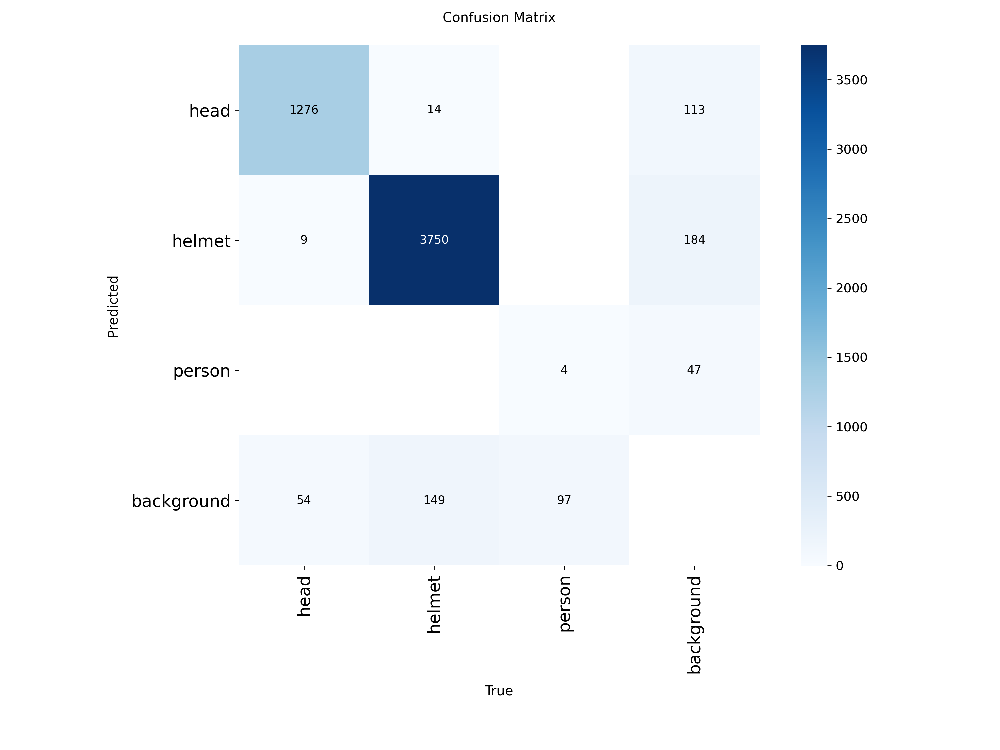


Precision-Recall Curve


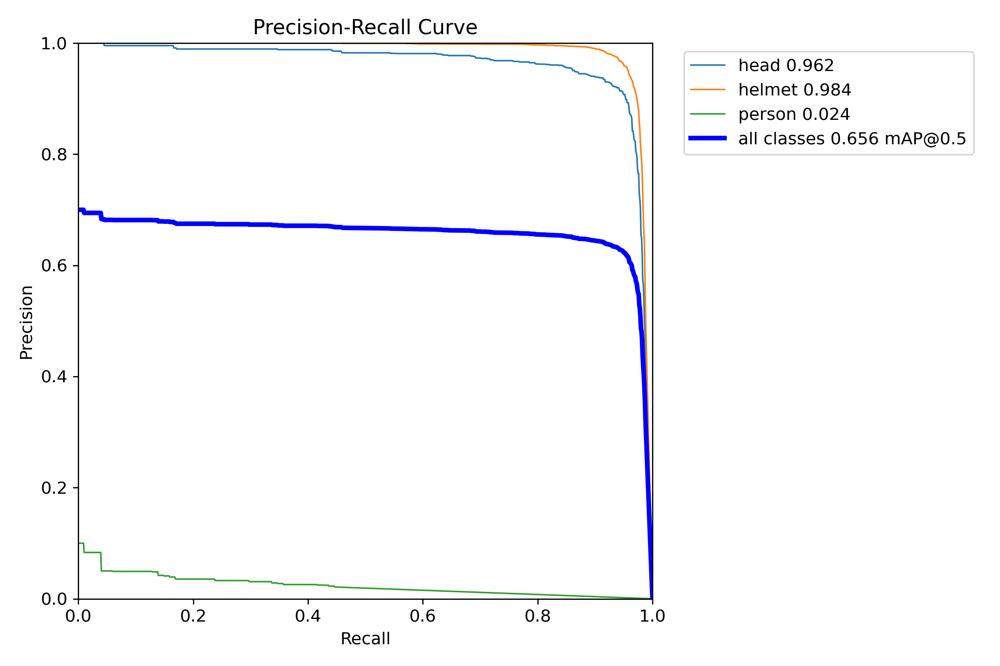


F1-Confidence Curve


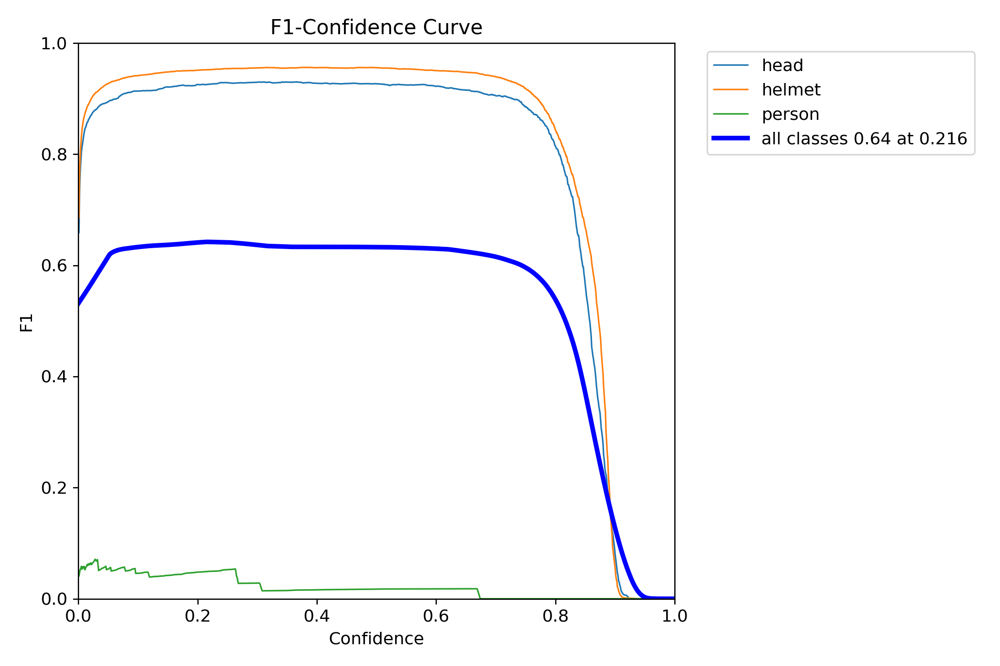


Results Table (image)


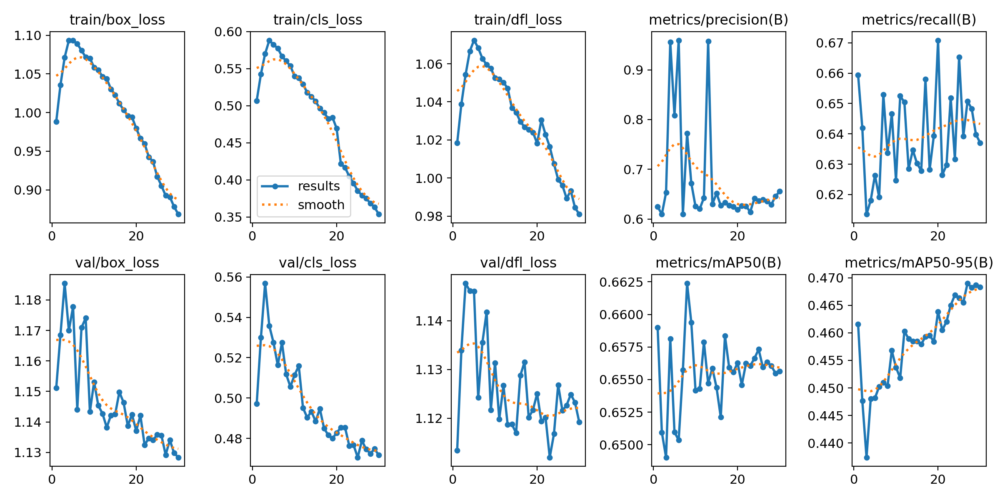

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


All plots + confusion matrix + full results downloaded for yolov8s_hardmining!


In [20]:
#VALIDATION ON FINE-TUNING MODEL (HARD MINING - ADDED CAP IMAGES)

from ultralytics import YOLO
import matplotlib.pyplot as plt
from google.colab import files
from IPython.display import Image, display
import os

model = YOLO("/content/runs/detect/helmet_caps_bg_ft3/weights/best.pt")

# run validation
metrics = model.val(
    data="/content/data_combo.yaml",
    imgsz=640,
    batch=16,
    save=True,
    plots=True,
    conf=0.001
    )

val_folder = results.save_dir

print("\n" + "="*75)
print("        ALL RESULTS + PLOTS FOR MODEL: yolov8s_640 (hard-mining-caps)")
print("="*75)

# Confusion Matrix
print("Confusion Matrix")
display(Image(os.path.join(val_folder, "confusion_matrix.png"), width=650))

# PR Curve
print("\nPrecision-Recall Curve")
display(Image(os.path.join(val_folder, "BoxPR_curve.png"), width=650))

# F1-Confidence Curve
print("\nF1-Confidence Curve")
display(Image(os.path.join(val_folder, "BoxF1_curve.png"), width=650))

# Results table (image or text)
results_png = os.path.join(val_folder, "results.png")
if os.path.exists(results_png):
    print("\nResults Table (image)")
    display(Image(results_png, width=900))
else:
    print("\nResults Table (text version)")
    print(f"mAP@50     : {results.results_dict['metrics/mAP50(B)']:.4f}")
    print(f"mAP@50:95  : {results.results_dict['metrics/mAP50-95(B)']:.4f}")
    print(f"Precision  : {results.results_dict['metrics/precision(B)']:.4f}")
    print(f"Recall     : {results.results_dict['metrics/recall(B)']:.4f}")

# Zip and download
zip_name = "val_results_yolov8s_hardmining_with_plots.zip"
!zip -q -r {zip_name} {val_folder}
files.download(zip_name)

print("\nAll plots + confusion matrix + full results downloaded for yolov8s_hardmining!")


In [23]:
import cv2
import numpy as np
import os
from ultralytics import YOLO
from IPython.display import display, Video

# ==========================================
# 1. HELPER FUNCTIONS
# ==========================================

def calculate_iou(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    interArea = max(0, xB - xA) * max(0, yB - yA)
    if interArea == 0: return 0

    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

    return interArea / float(boxAArea + boxBArea - interArea)

def is_center_inside_head_zone(person_box, helmet_box, head_ratio=0.3):
    px1, py1, px2, py2 = person_box[:4]
    hx1, hy1, hx2, hy2 = helmet_box[:4]

    h_center_x = (hx1 + hx2) / 2
    h_center_y = (hy1 + hy2) / 2

    p_height = py2 - py1
    head_y_max = py1 + (p_height * head_ratio)

    inside_x = px1 < h_center_x < px2
    inside_y = py1 < h_center_y < head_y_max

    return inside_x and inside_y

# ==========================================
# 2. CONFIGURATION & MODELS
# ==========================================

print("Loading models...")
model_person = YOLO('yolov8n.pt')
# Certifique-se que o seu modelo best.pt ainda está no Colab (se reiniciou, precisa subir de novo)
model_ppe = YOLO("/content/runs/detect/helmet_caps_bg_ft3/weights/best.pt")

# PATHS (Updated for the YouTube Clip)
video_path = '/content/Ajuste_de_Personagens_e_Geração_de_Vídeo.mp4'
output_raw_path = '/content/output_clip_safety.mp4'
output_display_path = '/content/output_clip_safety_final.mp4'

# Parameters
CONF_PERSON = 0.5
CONF_HELMET = 0.25
FALL_AR_THRESHOLD = 1.25
IOU_THRESHOLD = 0.05
HEAD_ZONE_RATIO = 0.3

# ==========================================
# 3. VIDEO PROCESSING LOOP
# ==========================================

if not os.path.exists(video_path):
    print(f"❌ Error: Video file not found at {video_path}. Did Step 1 finish successfully?")
else:
    cap = cv2.VideoCapture(video_path)
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = int(cap.get(cv2.CAP_PROP_FPS))

    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_raw_path, fourcc, fps, (width, height))

    print(f"Starting processing clip... (Fall AR > {FALL_AR_THRESHOLD})")

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret: break

        # A. Run Inference
        results_person = model_person.predict(frame, classes=[0], conf=CONF_PERSON, verbose=False)
        results_ppe = model_ppe.predict(frame, conf=CONF_HELMET, verbose=False)

        person_boxes = results_person[0].boxes.data.cpu().numpy()
        helmet_boxes = results_ppe[0].boxes.data.cpu().numpy()

        # B. Process each person
        for p_box in person_boxes:
            px1, py1, px2, py2, _, _ = p_box
            p_w, p_h = px2 - px1, py2 - py1

            # Logic 1: Fall Detection
            aspect_ratio = p_w / p_h
            is_fallen = aspect_ratio > FALL_AR_THRESHOLD

            # Logic 2: Helmet Association (Hybrid)
            has_helmet = False
            head_box_iou = [px1, py1, px2, py1 + (p_h * HEAD_ZONE_RATIO)]

            for h_box in helmet_boxes:
                helmet_rect = h_box[:4]
                iou_val = calculate_iou(head_box_iou, helmet_rect)
                check_iou = iou_val > IOU_THRESHOLD
                check_geo = is_center_inside_head_zone(p_box, h_box, HEAD_ZONE_RATIO)

                if check_iou or check_geo:
                    has_helmet = True
                    cv2.rectangle(frame, (int(h_box[0]), int(h_box[1])), (int(h_box[2]), int(h_box[3])), (255, 0, 0), 2)
                    break

            # Logic 3: Visuals
            status_text = "FALL DETECTED" if is_fallen else "STANDING"
            is_safe = (not is_fallen) and has_helmet
            color = (0, 255, 0) if is_safe else (0, 0, 255)

            label = f"{status_text} | Helmet: {'YES' if has_helmet else 'NO'}"

            cv2.rectangle(frame, (int(px1), int(py1)), (int(px2), int(py2)), color, 2)

            # Label
            (w_label, h_label), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 2)
            cv2.rectangle(frame, (int(px1), int(py1) - 20), (int(px1) + w_label, int(py1)), color, -1)
            cv2.putText(frame, label, (int(px1), int(py1) - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)

        out.write(frame)

    cap.release()
    out.release()
    print("Processing finished.")

    # ==========================================
    # 4. CONVERT & DISPLAY
    # ==========================================

    if os.path.exists(output_raw_path):
        print("Converting video for web display...")
        os.system(f"ffmpeg -y -i {output_raw_path} -vcodec libx264 -crf 23 -preset fast {output_display_path} -hide_banner -loglevel error")
        display(Video(output_display_path, embed=True, width=800))
    else:
        print("Error: Output file not found.")

Loading models...
Starting processing clip... (Fall AR > 1.25)
Processing finished.
Converting video for web display...


In [25]:
from pathlib import Path
import shutil

CAPS_LBL_DIR = Path("/content/Caps-2/train/labels")
CAPS_LBL_BACKUP = CAPS_LBL_DIR.parent / "labels_backup"  # ou "labels_backup"

if CAPS_LBL_BACKUP.exists():
    restored = 0
    for lbl_path in CAPS_LBL_BACKUP.glob("*.txt"):
        dest = CAPS_LBL_DIR / lbl_path.name
        shutil.copy(lbl_path, dest)
        restored += 1
    print("Labels restaurados do backup:", restored)
else:
    print("Backup de labels não encontrado. Se precisar, reextraia o dataset Caps-2.")


Labels restaurados do backup: 2041


In [26]:
from pathlib import Path

CAPS_LBL_DIR = Path("/content/Caps-2/train/labels")
OLD_CAP_ID = 0   # id atual nos arquivos do Caps-2
NEW_CAP_ID = 3   # nova classe "cap"

changed_files = 0
lines_changed = 0

for lbl_path in CAPS_LBL_DIR.glob("*.txt"):
    text = lbl_path.read_text().strip()
    if not text:
        continue
    new_lines = []
    changed = False
    for line in text.splitlines():
        parts = line.split()
        if len(parts) != 5:
            continue
        cls = int(float(parts[0]))
        if cls == OLD_CAP_ID:
            parts[0] = str(NEW_CAP_ID)
            changed = True
            lines_changed += 1
        new_lines.append(" ".join(parts))
    if changed:
        lbl_path.write_text("\n".join(new_lines) + "\n")
        changed_files += 1

print("Arquivos alterados:", changed_files)
print("Linhas alteradas (labels cap):", lines_changed)


Arquivos alterados: 1928
Linhas alteradas (labels cap): 2722


In [5]:
from pathlib import Path

HH_TRAIN_IMG_DIR = Path("/content/Hard-Hat-Workers-10/train/images")
CAPS_IMG_DIR     = Path("/content/Caps-2/train/images")

train_list_path = Path("/content/train_combo_multiclass.txt")

with open(train_list_path, "w") as f:
    # Hard-Hat
    for img_path in sorted(HH_TRAIN_IMG_DIR.glob("*.*")):
        if img_path.suffix.lower() not in [".jpg", ".jpeg", ".png"]:
            continue
        f.write(str(img_path.resolve()) + "\n")
    # Caps-2
    for img_path in sorted(CAPS_IMG_DIR.glob("*.*")):
        if img_path.suffix.lower() not in [".jpg", ".jpeg", ".png"]:
            continue
        f.write(str(img_path.resolve()) + "\n")

print("train_combo_multiclass.txt criado em:", train_list_path)
print("Total de imagens listadas:", sum(1 for _ in open(train_list_path)))


train_combo_multiclass.txt criado em: /content/train_combo_multiclass.txt
Total de imagens listadas: 6957


In [6]:
import yaml
from ultralytics import YOLO

base_model = YOLO("/content/best.pt")
names = base_model.names  # ex: {0: 'head', 1: 'helmet', 2: 'person'}

# adiciona nova classe 'cap' na posição 3
names_multi = dict(names)
names_multi[3] = 'cap'
nc_multi = len(names_multi)

data_multi = {
    "path": "",
    "train": str(train_list_path),
    "val": "/content/Hard-Hat-Workers-10/valid/images",
    "names": names_multi,
    "nc": nc_multi,
}

multi_yaml_path = "/content/data_multi.yaml"
with open(multi_yaml_path, "w") as f:
    yaml.safe_dump(data_multi, f, sort_keys=False)

print("data_multi.yaml criado em:", multi_yaml_path)
print(data_multi)


data_multi.yaml criado em: /content/data_multi.yaml
{'path': '', 'train': '/content/train_combo_multiclass.txt', 'val': '/content/Hard-Hat-Workers-10/valid/images', 'names': {0: 'head', 1: 'helmet', 2: 'person', 3: 'cap'}, 'nc': 4}


In [7]:
from ultralytics import YOLO

model = YOLO("/content/best.pt")

results = model.train(
    data="/content/data_multi.yaml",
    epochs=30,
    imgsz=640,
    batch=16,
    lr0=0.001,
    name="helmet_vs_cap_multiclass"
)


Ultralytics 8.3.234 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/data_multi.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/best.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=helmet_vs_cap_multiclass, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0

In [8]:
import cv2
import numpy as np
import os
from ultralytics import YOLO
from IPython.display import display, Video

# ==========================================
# 1. HELPER FUNCTIONS
# ==========================================

def calculate_iou(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    interArea = max(0, xB - xA) * max(0, yB - yA)
    if interArea == 0:
        return 0

    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])

    return interArea / float(boxAArea + boxBArea - interArea)

def is_center_inside_head_zone(person_box, helmet_box, head_ratio=0.3):
    px1, py1, px2, py2 = person_box[:4]
    hx1, hy1, hx2, hy2 = helmet_box[:4]

    h_center_x = (hx1 + hx2) / 2
    h_center_y = (hy1 + hy2) / 2

    p_height = py2 - py1
    head_y_max = py1 + (p_height * head_ratio)

    inside_x = px1 < h_center_x < px2
    inside_y = py1 < h_center_y < head_y_max

    return inside_x and inside_y

# ==========================================
# 2. CONFIGURATION & MODELS
# ==========================================

print("Loading models...")
model_person = YOLO('yolov8n.pt')
model_ppe = YOLO("/content/runs/detect/helmet_vs_cap_multiclass/weights/best.pt")

# descobrir os ids de classe do modelo PPE
ppe_names = model_ppe.names
HELMET_ID = [k for k, v in ppe_names.items() if v.lower() == "helmet"][0]
CAP_ID    = [k for k, v in ppe_names.items() if v.lower() == "cap"][0]
print("PPE classes:", ppe_names)
print("HELMET_ID:", HELMET_ID, "CAP_ID:", CAP_ID)

# PATHS
video_path = '/content/Ajuste_de_Personagens_e_Geração_de_Vídeo.mp4'
output_raw_path = '/content/output_clip_safety.mp4'
output_display_path = '/content/output_clip_safety_final.mp4'

# Parameters
CONF_PERSON = 0.5
CONF_PPE    = 0.25
FALL_AR_THRESHOLD = 1.25
IOU_THRESHOLD = 0.05
HEAD_ZONE_RATIO = 0.3

# ==========================================
# 3. VIDEO PROCESSING LOOP
# ==========================================

if not os.path.exists(video_path):
    print(f"❌ Error: Video file not found at {video_path}.")
else:
    cap = cv2.VideoCapture(video_path)
    width  = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps    = int(cap.get(cv2.CAP_PROP_FPS))

    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(output_raw_path, fourcc, fps, (width, height))

    print(f"Starting processing clip... (Fall AR > {FALL_AR_THRESHOLD})")

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # A. Run Inference
        results_person = model_person.predict(frame, classes=[0], conf=CONF_PERSON, verbose=False)
        results_ppe    = model_ppe.predict(frame, conf=CONF_PPE, verbose=False)

        person_boxes = results_person[0].boxes.data.cpu().numpy()
        ppe_boxes    = results_ppe[0].boxes.data.cpu().numpy()  # [x1,y1,x2,y2,conf,cls]

        # B. Process each person
        for p_box in person_boxes:
            px1, py1, px2, py2, _, _ = p_box
            p_w, p_h = px2 - px1, py2 - py1

            # Logic 1: Fall Detection
            aspect_ratio = p_w / p_h
            is_fallen = aspect_ratio > FALL_AR_THRESHOLD

            # Logic 2: PPE Association (helmet vs cap)
            has_helmet = False
            has_cap    = False

            head_box_iou = [px1, py1, px2, py1 + (p_h * HEAD_ZONE_RATIO)]

            for h_box in ppe_boxes:
                x1, y1, x2, y2, conf, cls_id = h_box
                cls_id = int(cls_id)

                # só nos interessam helmet ou cap
                if cls_id not in (HELMET_ID, CAP_ID):
                    continue

                helmet_rect = [x1, y1, x2, y2]
                iou_val  = calculate_iou(head_box_iou, helmet_rect)
                check_iou = iou_val > IOU_THRESHOLD
                check_geo = is_center_inside_head_zone(p_box, h_box, HEAD_ZONE_RATIO)

                if check_iou or check_geo:
                    if cls_id == HELMET_ID:
                        has_helmet = True
                        box_color = (255, 0, 0)   # azul p/ capacete
                    elif cls_id == CAP_ID:
                        has_cap = True
                        box_color = (0, 255, 255) # amarelo p/ boné (inseguro)

                    cv2.rectangle(
                        frame,
                        (int(x1), int(y1)),
                        (int(x2), int(y2)),
                        box_color,
                        2
                    )
                    # se já achou capacete, pode parar; capacete tem prioridade
                    if has_helmet:
                        break

            # Logic 3: Visuals (cap é SEMPRE inseguro)
            status_text = "FALL DETECTED" if is_fallen else "STANDING"
            is_safe = (not is_fallen) and has_helmet  # cap não conta como seguro

            color = (0, 255, 0) if is_safe else (0, 0, 255)

            if has_helmet:
                ppe_status = "HELMET"
            elif has_cap:
                ppe_status = "CAP"
            else:
                ppe_status = "NONE"

            label = f"{status_text} | PPE: {ppe_status}"

            # desenha bbox da pessoa
            cv2.rectangle(frame, (int(px1), int(py1)), (int(px2), int(py2)), color, 2)

            # Label acima da cabeça
            (w_label, h_label), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 2)
            cv2.rectangle(frame, (int(px1), int(py1) - 20), (int(px1) + w_label, int(py1)), color, -1)
            cv2.putText(frame, label, (int(px1), int(py1) - 5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)

        out.write(frame)

    cap.release()
    out.release()
    print("Processing finished.")

    # ==========================================
    # 4. CONVERT & DISPLAY
    # ==========================================

    if os.path.exists(output_raw_path):
        print("Converting video for web display...")
        os.system(
            f"ffmpeg -y -i {output_raw_path} -vcodec libx264 -crf 23 -preset fast "
            f"{output_display_path} -hide_banner -loglevel error"
        )
        display(Video(output_display_path, embed=True, width=800))
    else:
        print("Error: Output file not found.")


Loading models...
PPE classes: {0: 'head', 1: 'helmet', 2: 'person', 3: 'cap'}
HELMET_ID: 1 CAP_ID: 3
Starting processing clip... (Fall AR > 1.25)
Processing finished.
Converting video for web display...
